<a href="https://colab.research.google.com/github/ryangprince/TensorFlow-Bootcamp/blob/main/05_transfer_learing_in_tensorflow_part_2_fine_tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning with TensorFlow Part 2: Fine-tuning

In the previous notebook, we covered transfer learning feature extraction, now it's time to learn about a new kind of transfer learning: fine-tuning.

In [ ]:
# Check if we're using a GPU
!nvidia-smi

Thu Feb 27 21:16:13 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Creating helper functions

In previous notebooks, we've created a bunch of helper functions, now we could rewrite the all, however, this is tedious.

So, it's a good idea to put functions you'll want to use again in a script you can download and import into your notebooks (or elsewhere).

We've done this for some of the functions we've use previsouly here: https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py

In [ ]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py

--2025-02-27 21:16:19--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2025-02-27 21:16:19 (122 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [ ]:
# Import helper functions we're going to use in this notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, walk_through_dir

🔑 **Note:** If you're running this notebook in Google Colab, when it times out Colab will delete `helper_functions.py`, so you'll have to redownload it if you want access to your helper functions.

## Let's get some data

This time we're going to see how we can use the pretrained models within `tf.keras.applications` and apply them to our own problem (recognizing images of food).

link: https://www.tensorflow.org/api_docs/python/tf/keras/applications

In [ ]:
# Get 10% of training data of 10 classes of Food101
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip

unzip_data('10_food_classes_10_percent.zip')

--2025-02-27 21:16:32--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.10.207, 142.251.12.207, 172.217.194.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.10.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 168546183 (161M) [application/zip]
Saving to: ‘10_food_classes_10_percent.zip’

10_food_classes_10_ 100%[===================>] 160.74M  21.9MB/s    in 9.0s    

2025-02-27 21:16:42 (17.9 MB/s) - ‘10_food_classes_10_percent.zip’ saved [168546183/168546183]



In [ ]:
# Check out how many images and subdirectories are in our dataset
walk_through_dir('10_food_classes_10_percent')

There are 2 directories and 0 images in '10_food_classes_10_percent'.
There are 10 directories and 0 images in '10_food_classes_10_percent/test'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/fried_rice'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/sushi'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/steak'.
There are 0 directories and 250 images in '10_food_classes_10_percent/tes

In [ ]:
# Create training and test directory paths
train_dir = '10_food_classes_10_percent/train'
test_dir = '10_food_classes_10_percent/test'

In [ ]:
import tensorflow as tf
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
train_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=train_dir,
                                                                            image_size=IMG_SIZE,
                                                                            label_mode='categorical',
                                                                            batch_size=BATCH_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(directory=test_dir,
                                                                image_size=IMG_SIZE,
                                                                label_mode='categorical',
                                                                batch_size=BATCH_SIZE)

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [ ]:
train_data_10_percent

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))>

Look the output of the last cell two cells we ran above.

We see it outputs:
* Number of total samples (750 images, 75 per class)
* Number of classes (10 types of food)
* Batch size (default 32) - says "None" in last call: `shape=(None, 224, 224, 3)`
* Image size (height, width) - (224, 224): `shape=(None, 224, 224, 3)`
* Number of color channels (red, green, blue) - 3: `shape=(None, 224, 224, 3)`
* Number of class labels in tensors (10 types of food) - `TensorSpec(shape=(None, 10)`



In [ ]:
# Check out the class names of our dataset
train_data_10_percent.class_names

['chicken_curry',
 'chicken_wings',
 'fried_rice',
 'grilled_salmon',
 'hamburger',
 'ice_cream',
 'pizza',
 'ramen',
 'steak',
 'sushi']

Our data in now in batches, and each batch has 32 images and 32 labels. You can view one batch using the `.take()` method that returns images (`element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)`) and labels (`TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))`).

To view a single batch pass "1" to `.take()`.

In [ ]:
# See an example of a batch of data (pixel values of image tensors & label vectors)
for images, labels in train_data_10_percent.take(1):
  print(images,labels)

tf.Tensor(
[[[[149.85715     75.92857     17.57143   ]
   [161.76021     79.974495    23.903063  ]
   [172.91327     81.19388     27.97959   ]
   ...
   [105.08695     61.301216    57.44416   ]
   [120.055756    70.984314    77.19864   ]
   [100.31599     48.315987    60.67313   ]]

  [[156.94897     86.90306     24.90306   ]
   [170.21939     90.505104    31.433676  ]
   [166.72958     77.58674     21.658163  ]
   ...
   [108.423416    63.62237     57.81123   ]
   [104.806206    54.801086    58.0205    ]
   [105.71908     52.71908     60.86194   ]]

  [[141.33673     75.551025    16.408165  ]
   [150.14796     73.71939     18.433674  ]
   [154.59183     69.54591     16.617348  ]
   ...
   [129.77585     80.72992     72.70447   ]
   [103.39811     51.770523    48.229725  ]
   [119.9747      65.54613     65.33184   ]]

  ...

  [[ 18.137741     1.1377411   18.709213  ]
   [ 19.214264     2.214264    19.785736  ]
   [ 20.336723     2.7857141   20.525558  ]
   ...
   [ 33.31621     10.719

In [ ]:
train_data_10_percent.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))

### Modelling experiments we're running

Experiments
* **Model 0** (baseline)
 * Data - 10 classes of Food101 data (**random 10%** training data only)
 * Preprocessing - None
 * Model - **Feature Extractor**: EfficientNetB0 (pre-trained on ImageNet, all layers frozen) with no top
* **Model 1**
 * Data - 10 classes of Food101 data (**random 1%** training data only)
 * Preprocessing - Random Flip, Rotation, Zoom, Height, Width data augmentation
 * Model - Same as Model 0
* **Model 2**
 * Data - Same as Model 0
 * Preprocessing - Same as Model 1
 * Model - Same as Model 0
* **Model 3**
 * Data - Same as Model 0
 * Preprocessing - Same as Model 1
 * Model - Fine-tuning: Model 2 (EfficientNetB0 pre-trained on ImageNet) **with top layer trained on custom data, top 10 layers unfrozen**
* **Model 4**
 * Data - 10 classes of Food101 data (**random 100%** training data only)
 * Preprocessing - same as Model 1
 * Model - Same as Model 2

### Keras Sequential vs Functional API

Sequential - Provides a straightforward way to build neural networks by stacking layers linearly. Ideal for siple, feedorward models where each layer receives input from the previous one and outputs to the next.
* Advantages
 * Simplicity - easy to use and understand, good for prototyping
 * Linear Structure - allows for easy visualization and comprehension of model architecture
 * Single Input/Output - supports a single input and a single output, good for basic applications
* Limitations
 * Linear Models Only - limited to creating linear stacks of layers, restricting ability to handle complex architectures
 * No Multiple Inputs/Outputs - doesn't support models with multiple inputs or outputs

Functional: offers more flexibility and power by allowing layers to be connected in a non-linear fashion, similar to a graph. Enables the creation of complex models withm multiple inputs, outputs, and shared layers.
* Advantages
 * Flexibility - allows for the design of intricate neurla network architectures, including models with mulitple inputs and outputs
 * Complex Architecture - supports shared layers and branching paths, making it suitable for advanced models like ResNet
 * Customization - provides a higher level of control over model architecture
* Limiations
 * Complexity - requires more code and understanding of how layers interact, which can be challenging for beginners
 * More Verbose - code can be more verbose compared to the Sequential API
 > Saying the Functional API is more "verbose" means that it often requires more lines and explicit definitions. This is because the Functional API requires you to manually specify how layers are connected, which can lead to longer code blocks.

Whats the same? No changes to compiling, fitting, and evaluating.

In [ ]:
New:

base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
Old:

base_model = tf.keras.applications.EfficientNetB0(include_top=False)


## Model 0: Building a tansfer learning feature extraction model using the Keras Functional API

The sequential API is straight-forward, it runs insequential order.

But the functional API gives us more flexibilitywith our models - https://www.tensorflow.org/guide/keras/functional_api

Some new things you're seeing:
* `tf.keras.layers.GlobalAveragePooling2D` - a pooling operation designed to replace fully connected layers in classical CNNs. The idea is to generate one feature map for each corresponding category of the classification task in the last mlpconv layer. Instead of adding fully connected layers on top of the feature maps, we take the average of each feature map, and the resulting vector is fed directly into the softmax layer.
 * One advantage of global average pooling over the fully connected layers is that it is more native to the convolution structure by enforcing correspondences between feature maps and categories. Thus the feature maps can be easily interpreted as categories confidence maps. Another advantage is that there is no parameter to optimize in the global average pooling thus overfitting is avoided at this layer.

In [ ]:
# 1. Create the base model with tf.keras.applications
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)

# 2. Freeze the base model (so the underlying pre-trained patterns aren't updated during training)
base_model.trainable = False

# 3. Create inputs into our model
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name='input_layer')

# 4. If using a model like ResNet50V2 you will need to normalize inputs (you don't have to for EfficientNet(s)... rescaling built in from tf.keras.applications)
# x = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs) # this format means we're passing the inputs layer and it's values to "x", a preprocessing layer

# 5. Pass the inputs to the base model
x = base_model(inputs)
print(f"Shape after passing inputs through base model: {x.shape}")

# 6. Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
x = tf.keras.layers.GlobalAveragePooling2D(name='global_average_pooling_layer')(x)
print(f"Shape after GlobalAveragePooling2D: {x.shape}")

# 7. Create the output activation layer
outputs = tf.keras.layers.Dense(10, activation='softmax', name='output_layer')(x)

# 8. Combine the inputs with the outputs into a model
model_0 = tf.keras.Model(inputs, outputs)

# 9. Compile the model
model_0.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

# 10. Fit the model and save its history
history_10_percent  = model_0.fit(train_data_10_percent,
                              epochs=5,
                              steps_per_epoch=len(train_data_10_percent),
                              validation_data=test_data,
                              validation_steps=int(0.25 * len(test_data)), # validate on only 25% of the test data for speed
                              callbacks=[create_tensorboard_callback(dir_name='transfer_learning',
                                                                     experiment_name='10_percent')])

Shape after passing inputs through base model: (None, 7, 7, 1280)
Shape after GlobalAveragePooling2D: (None, 1280)
Saving TensorBoard log files to: transfer_learning/10_percent/20250227-214507
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 40s 741ms/step - accuracy: 0.2579 - loss: 2.1103 - val_accuracy: 0.7188 - val_loss: 1.3566
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - accuracy: 0.7584 - loss: 1.2404 - val_accuracy: 0.7812 - val_loss: 0.9275
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - accuracy: 0.8010 - loss: 0.8844 - val_accuracy: 0.8125 - val_loss: 0.7689
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - accuracy: 0.8439 - loss: 0.7034 - val_accuracy: 0.8438 - val_loss: 0.6458
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - accuracy: 0.8732 - loss: 0.5975 - val_accuracy: 0.8438 - val_loss: 0.5997


In [ ]:
# Evaluate on the full test dataset
model_0.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 117ms/step - accuracy: 0.8554 - loss: 0.5648


[0.5675479769706726, 0.8560000061988831]

In [ ]:
# Check the layers in our base model
for layer_number, layer in enumerate(base_model.layers):
  print(layer_number, layer.name)

0 input_layer_1
1 rescaling
2 normalization
3 stem_conv
4 stem_bn
5 stem_activation
6 block1a_project_conv
7 block1a_project_bn
8 block1a_project_activation
9 block2a_expand_conv
10 block2a_expand_bn
11 block2a_expand_activation
12 block2a_project_conv
13 block2a_project_bn
14 block2b_expand_conv
15 block2b_expand_bn
16 block2b_expand_activation
17 block2b_project_conv
18 block2b_project_bn
19 block2b_drop
20 block2b_add
21 block3a_expand_conv
22 block3a_expand_bn
23 block3a_expand_activation
24 block3a_project_conv
25 block3a_project_bn
26 block3b_expand_conv
27 block3b_expand_bn
28 block3b_expand_activation
29 block3b_project_conv
30 block3b_project_bn
31 block3b_drop
32 block3b_add
33 block4a_expand_conv
34 block4a_expand_bn
35 block4a_expand_activation
36 block4a_dwconv2
37 block4a_bn
38 block4a_activation
39 block4a_se_squeeze
40 block4a_se_reshape
41 block4a_se_reduce
42 block4a_se_expand
43 block4a_se_excite
44 block4a_project_conv
45 block4a_project_bn
46 block4b_expand_conv
47

In [ ]:
# How about we get a summary of the base model?
base_model.summary()

Model: "efficientnetv2-b0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, None, None, 3)  │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, None, None, 3)  │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, None, None, 3)  │              0 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, None, None, 32) │            864 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, None, None, 32) │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, None, None, 32) │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_conv      │ (None, None, None, 16) │          4,608 │ stem_activation[0][0]  │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_bn        │ (None, None, None, 16) │             64 │ block1a_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_activati… │ (None, None, None, 16) │              0 │ block1a_project_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_conv       │ (None, None, None, 64) │          9,216 │ block1a_project_activ… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_bn         │ (None, None, None, 64) │            256 │ block2a_expand_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_activation │ (None, None, None, 64) │              0 │ block2a_expand_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_project_conv      │ (None, None, None, 32) │          2,048 │ block2a_expand_activa… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_project_bn        │ (None, None, None, 32) │            128 │ block2a_project_conv[… │
│ (BatchNormalization) 

 Total params: 5,919,312 (22.58 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
# How about a summary of our whole model?
model_0.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,957,744 (22.73 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

 Optimizer params: 25,622 (100.09 KB)

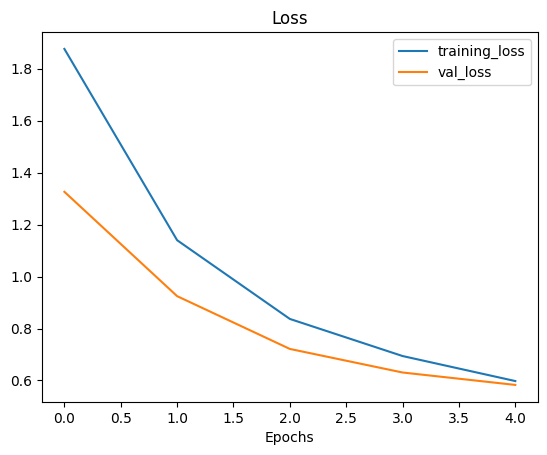

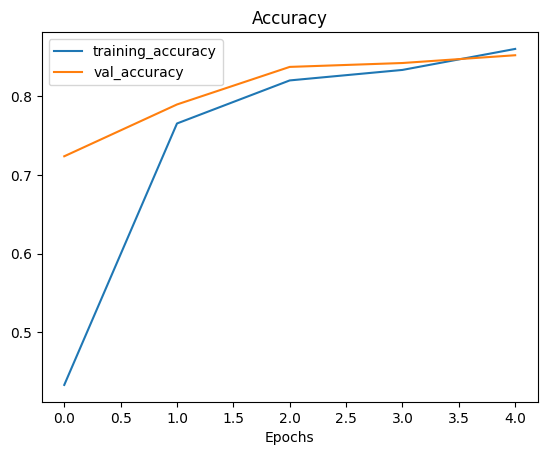

In [ ]:
# Check out our model's training curves
plot_loss_curves(history_10_percent)

## Getting a feature vector from a trained model

Let's demonstrate the Global Average Pooling 2D layer...

We have a tensor after our model goes through `base_model` of shape (None, 7, 7, 1280).
> The "None" in (None, 7, 7, 1280) is leaving room for our model to go through our data in batches!

But when it passes through `GlobalAveragePooling2D`, it turns into (None, 1280).
> *In other words...* this layer is turning a 4D tensor into a 2D tensor.

Let's use a similar shaped tensor of (1, 4, 4, 3) and then pass it to `GlobalAveragePooling2D`.

In [ ]:
# Define the input shape
input_shape = (1, 4, 4, 3)

# Create a random tensor
tf.random.set_seed(42)
input_tensor = tf.random.normal(input_shape)
print(f"Random input tensor:\n {input_tensor}\n")

# Pass the random tensor through a global average pooling 2D layer
global_average_pooled_tensor = tf.keras.layers.GlobalAveragePooling2D()(input_tensor)
print(f"2D global average pooled random tensor:\n {global_average_pooled_tensor}\n")

# Check the shape of the different tensors
print(f'Shape of input tensor: {input_tensor.shape}')
print(f'Shape of Global Averaged Pooled 2D tensor: {global_average_pooled_tensor.shape}')

Random input tensor:
 [[[[ 0.3274685  -0.8426258   0.3194337 ]
   [-1.4075519  -2.3880599  -1.0392479 ]
   [-0.5573232   0.539707    1.6994323 ]
   [ 0.28893656 -1.5066116  -0.2645474 ]]

  [[-0.59722406 -1.9171132  -0.62044144]
   [ 0.8504023  -0.40604794 -3.0258412 ]
   [ 0.9058464   0.29855987 -0.22561555]
   [-0.7616443  -1.8917141  -0.93847126]]

  [[ 0.77852213 -0.47338894  0.97772694]
   [ 0.24694404  0.20573746 -0.52562326]
   [ 0.32410017  0.02545409 -0.10638496]
   [-0.63694745  1.1603122   0.2507359 ]]

  [[-0.41728503  0.4012578  -1.4145443 ]
   [-0.5931857  -1.6617213   0.33567193]
   [ 0.10815628  0.23479679 -0.56668764]
   [-0.35819843  0.88698614  0.52744764]]]]

2D global average pooled random tensor:
 [[-0.09368646 -0.45840448 -0.2885598 ]]

Shape of input tensor: (1, 4, 4, 3)
Shape of Global Averaged Pooled 2D tensor: (1, 3)


As we can see, `GlobalAveragePooling2D` removed the two inner dimensions (1, **4, 4**, 3) and output a feature vector with dimensions of (1, 3).

And, it is the 2D vector that is passed to the dense **outputs** layer.

In [ ]:
# Let's replicate the GlobalAveragePool2D layer
tf.reduce_mean(input_tensor, axis=[1, 2])

<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[-0.09368646, -0.45840448, -0.2885598 ]], dtype=float32)>

> 🛠 **Practice:** Try to do the same with the above two cells but this time use `GlobalMaxPool2d`... and see what happens.

> 🔑 **Note:** One of the reasons feature extraction transfer learning is named how it is is because what often happens is a pretrained model outputs a **feature vector** (a long tensor of numbers which represents the learned representation of the model on a partiuclar sample, in our case, this is output of the `tf.keras.layers.GlobalAveragePooling2D()` layer) which can then be used to extract patterns out of it for our own specific problem.

In [ ]:
# Practice
# Check input tensor is the same as above
print(f'Random input tensor: {input_tensor}\n')

# Pass the random tensor through a global max pooling 2D layer
global_max_pooled_tensor = tf.keras.layers.GlobalMaxPool2D()(input_tensor)
print(f'2D global max pooled random tensor: {global_max_pooled_tensor}\n')

# Check the shape of the different tensors
print(f'Shape of the input tensor: {input_tensor.shape}')
print(f'Shape of the Global Max Pooled 2D tensor: {global_max_pooled_tensor.shape}')

Random input tensor: [[[[ 0.3274685  -0.8426258   0.3194337 ]
   [-1.4075519  -2.3880599  -1.0392479 ]
   [-0.5573232   0.539707    1.6994323 ]
   [ 0.28893656 -1.5066116  -0.2645474 ]]

  [[-0.59722406 -1.9171132  -0.62044144]
   [ 0.8504023  -0.40604794 -3.0258412 ]
   [ 0.9058464   0.29855987 -0.22561555]
   [-0.7616443  -1.8917141  -0.93847126]]

  [[ 0.77852213 -0.47338894  0.97772694]
   [ 0.24694404  0.20573746 -0.52562326]
   [ 0.32410017  0.02545409 -0.10638496]
   [-0.63694745  1.1603122   0.2507359 ]]

  [[-0.41728503  0.4012578  -1.4145443 ]
   [-0.5931857  -1.6617213   0.33567193]
   [ 0.10815628  0.23479679 -0.56668764]
   [-0.35819843  0.88698614  0.52744764]]]]

2D global max pooled random tensor: [[0.9058464 1.1603122 1.6994323]]

Shape of the input tensor: (1, 4, 4, 3)
Shape of the Global Max Pooled 2D tensor: (1, 3)


In [ ]:
# Let's replicate the GlobalMaxPool2D layer
tf.reduce_max(input_tensor, axis=[1, 2])

<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[0.9058464, 1.1603122, 1.6994323]], dtype=float32)>

So, `GlobalAveragePooling2D` gets the mean ("Average") and `GlobalMaxPool2D` looks at the max ("Max").

What is a feature vector?

* A feature vector is a learned representation of the input daat (a compressed form of the input data based on how the model see's it)

EfficientNet feature extractor

* We have our EfficientNetb0 architecture - the weights are frozen (unchanged)
* We pass in our input data
* It comes out as a large dimensional tensor
* Then we pool it to condense all the most important features into a feature vector
* And then we add our own classification layer (dense layer) to ouput representations in the same shape as the number of classes we have

## Run a series of transfer learning experiments

We've seen the incredible results transfer learning can get with only 10% of the training data... how about we set up a bunch of experiments to find out:

1. `model_1` - use feature extraction transfer learning with 1% of the training data with data augmentation
2. `model_2` - use feature extraction transfer learning with 10% of the training data with data augmentation
3. `model_3` - use fine-tuning transfer learning on 10% of the training data with data augmentation
4. `model_4` - use fine-tuning transfer learning with 100% of the training data with data augmentation


> 🔑 **Note:** throughout all experiments the same test dataset will be used to evaluate our model... this ensure consistency across evaluation metrics.

### Getting and preprocessing data for model_1

In [ ]:
# Import the helper_functions.py from GitHub
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py

--2025-02-27 21:18:00--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py.1’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2025-02-27 21:18:00 (74.7 MB/s) - ‘helper_functions.py.1’ saved [10246/10246]



In [ ]:
# Get the helper functions from helper_functions.py
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, walk_through_dir

In [ ]:
# Download and unzip data - preprocessed from Food101
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_1_percent.zip
unzip_data('10_food_classes_1_percent.zip')

--2025-02-27 21:18:06--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_1_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.68.207, 64.233.170.207, 142.251.175.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.68.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 133612354 (127M) [application/zip]
Saving to: ‘10_food_classes_1_percent.zip’

10_food_classes_1_p 100%[===================>] 127.42M  22.2MB/s    in 7.2s    

2025-02-27 21:18:14 (17.7 MB/s) - ‘10_food_classes_1_percent.zip’ saved [133612354/133612354]



In [ ]:
# Create training and test dirs
train_dir_1_percent = '10_food_classes_1_percent/train'
test_dir_1_percent = '10_food_classes_1_percent/test'

In [ ]:
# How many images are we working with?
walk_through_dir('10_food_classes_1_percent')

There are 2 directories and 0 images in '10_food_classes_1_percent'.
There are 10 directories and 0 images in '10_food_classes_1_percent/test'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/fried_rice'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/sushi'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/steak'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/ice_cream'

In [ ]:
# Setup data loaders
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
train_data_1_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=train_dir_1_percent,
                                                                           image_size=IMG_SIZE,
                                                                           label_mode='categorical',
                                                                           batch_size=BATCH_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(directory=test_dir_1_percent,
                                                                image_size=IMG_SIZE,
                                                                label_mode='categorical',
                                                                batch_size=BATCH_SIZE)

Found 70 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


## Adding data augmentation right into the model

To add data augmentation right into our models, we can use the layers inside:

* `tf.keras.layers.experiment.preprocessing()`

Off the top of our heads, after reading the docs, the benefits of using data augmentation inside the model are:
* Preprocessing of images (augmenting them) happens on the GPU (much faster) rather than the CPU.
* Image data augmentation only happens during training, so we can still export our whole model and use it elsewhere.

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Create a data augmentation stage with horizontal flipping, rotations, zoooms, etc.
data_augmentation = keras.Sequential([
    layers.Input(shape=input_shape), # added this layer to avoid error message because layer thinks shape should be (None, 512, 512, 3)
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
    layers.RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2)),
    layers.RandomTranslation(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2))
    # layers.Rescaling(scale=1./255) # Keep for models like ResNet50V2 but EfficientNet's having rescaling built-in
], name='data_augmentation')

In [ ]:
Code before
This code appears at 5:46 in the next video.

augmented_img = data_augmentation(img)

Doing this would result in images sometimes not being augmented (changed).

Code after the fix
augmented_img = data_augmentation(img, training=True)



### Visualize our data augmentation layer (and see what happens to our data)

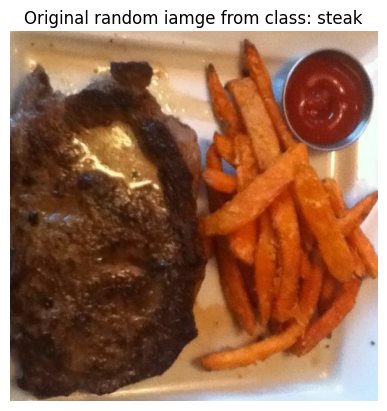

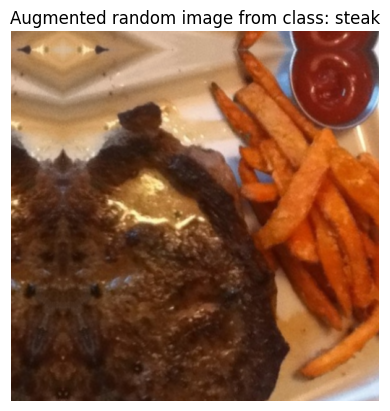

In [ ]:
# View a random image and compare it to its augmented version
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random

target_class = random.choice(train_data_1_percent.class_names)
target_dir = '10_food_classes_1_percent/train/' + target_class
random_image = random.choice(os.listdir(target_dir))
random_image_path = target_dir + '/' + random_image

# Read and plot in the random image
img = mpimg.imread(random_image_path)
plt.imshow(img)
plt.title(f"Original random iamge from class: {target_class}")
plt.axis(False);

# Now let's plot our augmented random image
augmented_img = data_augmentation(tf.expand_dims(img, axis=0))
plt.figure()
plt.imshow(tf.squeeze(augmented_img)/255.)
plt.title(f'Augmented random image from class: {target_class}')
plt.axis(False);

## Model 1: Feature extraction transfer learning on 1% of the data with data augmentation

In [ ]:
# Setup the input shape and base model, freezing the base model layers
input_shape = (224, 224, 3)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False

# Create the input layer
inputs = layers.Input(shape=input_shape, name='input_layer')
print(f'Shape of inputs layer: {inputs.shape}')

# Add in data augmentation Sequential model as a layer
# Needed to update the data_augmentation layer with an additional inputs layer so shape would be correct
x = data_augmentation(inputs)

# Give base_model the inputs (after augmentation) and don't train it
x = base_model(x, training=False)

# Pool output features of the base model
x = layers.GlobalAveragePooling2D(name='global_average_pooling_layer')(x)

# Put a dense layer on as the output
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)

# Make a model using the inputs and outputs
model_1 = keras.Model(inputs, outputs)

# Compile the model
model_1.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

# Fit the model
history_1_percent = model_1.fit(train_data_1_percent,
                                epochs=5,
                                steps_per_epoch=len(train_data_1_percent),
                                validation_data=test_data,
                                validation_steps=int(0.25 * len(test_data)),
                                # Track model training
                                callbacks=[create_tensorboard_callback(dir_name='transfer_learning',
                                                                       experiment_name='1_percent_data_aug')])

Shape of inputs layer: (None, 224, 224, 3)
Saving TensorBoard log files to: transfer_learning/1_percent_data_aug/20250227-220001
Epoch 1/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - accuracy: 0.0819 - loss: 2.3284 - val_accuracy: 0.1513 - val_loss: 2.2828
Epoch 2/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 601ms/step - accuracy: 0.1033 - loss: 2.1782 - val_accuracy: 0.2368 - val_loss: 2.1846
Epoch 3/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 591ms/step - accuracy: 0.2581 - loss: 2.0274 - val_accuracy: 0.3059 - val_loss: 2.0930
Epoch 4/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.3843 - loss: 1.9076 - val_accuracy: 0.3339 - val_loss: 2.0170
Epoch 5/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step - accuracy: 0.4968 - loss: 1.7992 - val_accuracy: 0.3783 - val_loss: 1.9344


In [ ]:
# Check out model summary
model_1.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,957,744 (22.73 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

 Optimizer params: 25,622 (100.09 KB)

In [ ]:
# Evaluate on the full test dataset and save results
results_1_percent_data_aug = model_1.evaluate(test_data)
results_1_percent_data_aug

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.3611 - loss: 1.9486


[1.9395296573638916, 0.37279999256134033]

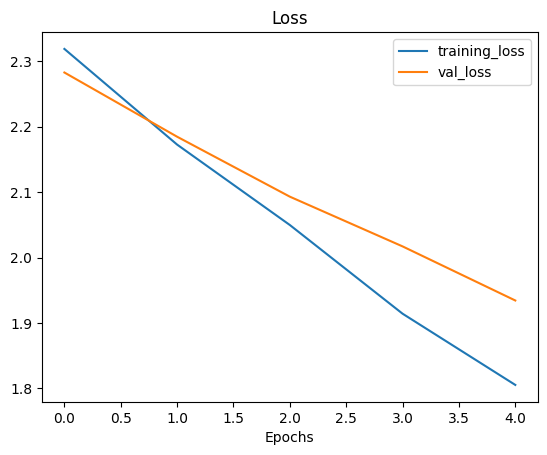

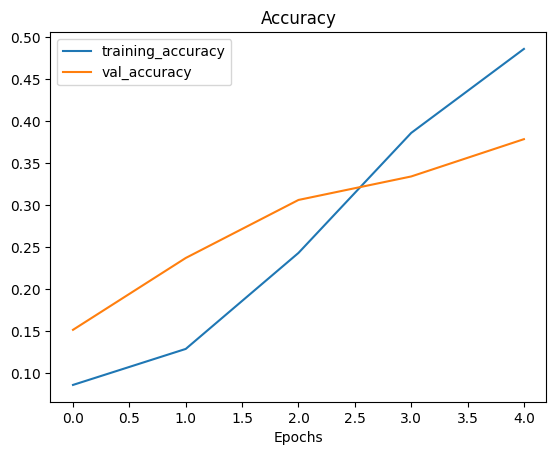

In [ ]:
# How does the loss curve look for the model with 1% of the data and data augmentation?
plot_loss_curves(history_1_percent)

## Model 2: feature extraction transfer learning model with 10% of the data and data augmentation

In [ ]:
# Get 10% of the data (already have it so skipping this step)

train_dir_10_percent = '10_food_classes_10_percent/train'
test_dir = '10_food_classes_10_percent/test'

In [ ]:
# Set up data inputs
IMG_SIZE = (224, 224)

train_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=train_dir,
                                                                            image_size=IMG_SIZE,
                                                                            label_mode='categorical')

test_data = tf.keras.preprocessing.image_dataset_from_directory(directory=test_dir,
                                                                image_size=IMG_SIZE,
                                                                label_mode='categorical')

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [ ]:
# Create model 2 with data augmentation built in

data_augmentation = keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
    layers.RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2)),
    layers.RandomTranslation(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2))
    # layers.Rescaling(scale=1./255) # Keep for models like ResNet50V2 but EfficientNet's having rescaling built-in
], name='data_augmentation')

# Setup the input shape to our model
input_shape = (224, 224, 3)

# Create a frozen base model (also called the backbone)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False

# Create the inputs and outputs (including the layers in between)
inputs = layers.Input(shape=input_shape, name='input_layer')
x = data_augmentation(inputs) # augment our training images (augmentation doesn't occur on test data)
x = base_model(x, training=False) # pass augmented images to base model but keep it in inference mode, this also ensure batchnorm layers don't get updated
x = layers.GlobalAveragePooling2D(name='global_average_pooling_2D')(x)
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)
model_2 = keras.Model(inputs, outputs)

# Compile
model_2.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

In [ ]:
# Summary of model_2
model_2.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_2D            │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

### Creating a ModelCheckpoint callback

THe ModelCheckpoint callback intermediately saves our model (the full model or just the weights) during training. This is useful so we can come and start where we left off.

In [ ]:
# Set checkpoint path
checkpoint_path = 'ten_percent_model_checkpoints_weights/checkpoint.weights.h5'

# Create a ModelCheckpoint callback that saves the model's weights only
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                         save_best_only=False,
                                                         save_weights_only=True,
                                                         save_freq='epoch', # save every epoch
                                                         verbose=1)

### Fit model 2 passing in the ModelCheckpoint callback

In [ ]:
# Fit the model saving checkpoints every epoch
initial_epochs = 5
history_10_percent_data_aug = model_2.fit(train_data_10_percent,
                                          epochs=initial_epochs,
                                          validation_data=test_data,
                                          validation_steps=int(0.25 * len(test_data)),
                                          callbacks=[create_tensorboard_callback(dir_name='transfer_learning',
                                                                                 experiment_name='10_percent_data_aug'),
                                                     checkpoint_callback])

Saving TensorBoard log files to: transfer_learning/10_percent_data_aug/20250227-224440
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.1914 - loss: 2.2201
Epoch 1: saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - accuracy: 0.1949 - loss: 2.2139 - val_accuracy: 0.6464 - val_loss: 1.5693
Epoch 2/5
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5918 - loss: 1.5729
Epoch 2: saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - accuracy: 0.5938 - loss: 1.5667 - val_accuracy: 0.7681 - val_loss: 1.1135
Epoch 3/5
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.7301 - loss: 1.1952
Epoch 3: saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.7286 - loss: 1.1943 - val_accuracy: 0.8026 - val_loss: 0.9067
Epoch 4/5
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - ac

In [ ]:
# What were model_0 results?
model_0.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - accuracy: 0.8607 - loss: 0.5722


[0.5762077569961548, 0.8560000061988831]

In [ ]:
# Check model_2 results on all test data
results_10_percent_data_aug = model_2.evaluate(test_data)
results_10_percent_data_aug

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.8270 - loss: 0.7003


[0.717724621295929, 0.8184000253677368]

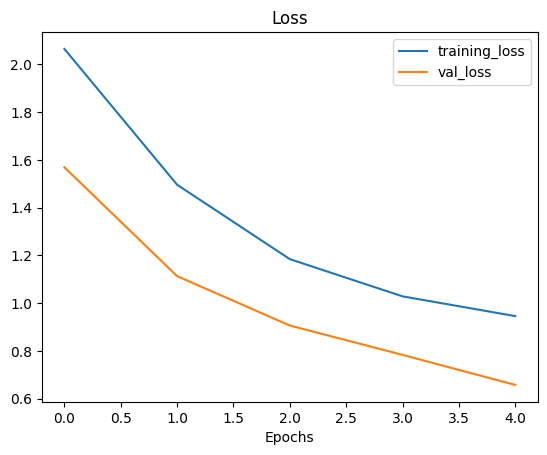

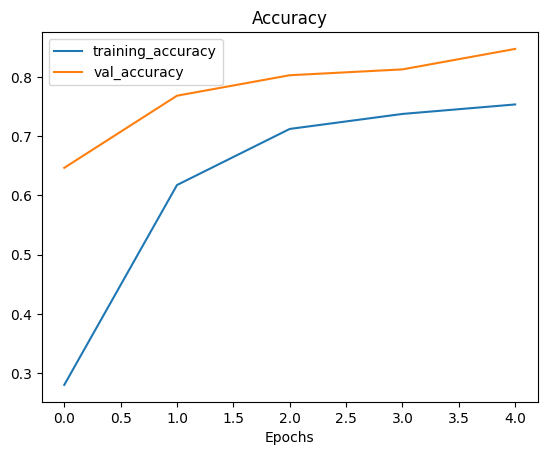

In [ ]:
# Plot model loss curves
plot_loss_curves(history_10_percent_data_aug)

### Loading in checkpointed weights

Loading in checkpointed weights returns a model to a specific checkpoint.

In [ ]:
# Load in saved model weights and evaluate model
model_2.load_weights(checkpoint_path)

In [ ]:
# Evaluate model_2 with loaded weights
loaded_weights_model_results = model_2.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step - accuracy: 0.8268 - loss: 0.7045


In [ ]:
# If the results of our previously evaluated model_2 match the loaded weights, everything has worked
results_10_percent_data_aug == loaded_weights_model_results

False

In [ ]:
results_10_percent_data_aug

[0.717724621295929, 0.8184000253677368]

In [ ]:
loaded_weights_model_results

[0.7177246809005737, 0.8184000253677368]

In [ ]:
# Check to see if loaded model results are very close to our previous non-loaded model results
import numpy as np
np.isclose(np.array(results_10_percent_data_aug), np.array(loaded_weights_model_results))

array([ True,  True])

In [ ]:
# Check the difference between the two results
print(np.array(results_10_percent_data_aug) - np.array(loaded_weights_model_results))

[-5.96046448e-08  0.00000000e+00]


So based on how computers store numbers (precision) the losses are slightly different, but the difference is very very small. You can use `np.isclose()` to check if the numbers are effectively the same, within a certain tolerance.

## Model 3: Fine-tuning and existing model on 10% of the data

> 🔑 **Note:** Fine-tuning usually works best *after* training a feature extraction model for a few epochs with large amounts of custom data.

So, you:
1. Build a feature extraction model first, and train the weights in the output layer
2. Then you unfreeze some of layers, keeping your output layer trained on your data

In this case, when we trained model_2 we saved the weights for 5 epochs, now we're going to fine-tune model_2 (model_3) for five epochs. Effectively model_3 is model_2 but trained on an additional 5 epochs.

In [ ]:
# Layers in loaded model
model_2.layers

[<InputLayer name=input_layer, built=True>,
 <Sequential name=data_augmentation, built=True>,
 <Functional name=efficientnetv2-b0, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling_2D, built=True>,
 <Dense name=output_layer, built=True>]

In [ ]:
# Are these layers trainable?
for layer in model_2.layers:
  print(layer, layer.trainable)

<InputLayer name=input_layer, built=True> True
<Sequential name=data_augmentation, built=True> True
<Functional name=efficientnetv2-b0, built=True> False
<GlobalAveragePooling2D name=global_average_pooling_2D, built=True> True
<Dense name=output_layer, built=True> True


All layers are trainable (True) except the **EfficientNetV2B0** layer  (False), aka the base_model.

In [ ]:
# What layers are in our base_model (EfficientNetV2B0) and are they trainable?
for i, layer in enumerate(model_2.layers[2].layers):
  print(i, layer.name, layer.trainable)

0 input_layer_15 False
1 rescaling_13 False
2 normalization_12 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a

In [ ]:
# How many trainable variables are in our base model? A trainable variable is a weight that can be updated
print(len(model_2.layers[2].trainable_variables))

0


In [ ]:
# To begin fine-tuning, let's start by setting the last 10 layers of our base_model.trainable = True
base_model.trainable = True

# Freeze all layers except for the last 10
for layer in base_model.layers[:-10]:
  layer.trainable = False

# Recompile (we have to recompile our models every time we make a change)
# Because base_model is a part of model_2, we have to recompile it after making changes to it's base_model layer
model_2.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine-tuning typically want to lower the learning rate by 10x
                metrics=['accuracy'])

#### 🔑 IMPORTANT Note: Adjusting the learning rate for fine-tuning

When we're fine-tuning a model, it's important to remember that the model has weights that have been tuned already. So, even though we're going to unfreeze some layers to train the weights further on our custom data, in order to ensure that we do not change the weights too much, we're going to *LOWER* the **learning rate** by **10x**! This is a rule of thumb 👍, though different soruces will claim other values [ULMFiT](https://arxiv.org/abs/1801.06146).

> So, the default learning rate for the Adam optimizer is *0.001*, and by lowering it by 10x for fine tuning, it now is going to be *0.0001*.

In [ ]:
# Check which layers are tunable (trainable)
for layer_number, layer in enumerate(model_2.layers[2].layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer_15 False
1 rescaling_13 False
2 normalization_12 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a

In [ ]:
# Now that we've unfrozen some of the layers closer to the top, how many trainable variables are there?
print(len(model_2.trainable_variables)), print(len(model_2.layers[2].trainable_variables))

12
10


(None, None)

In [ ]:
# Fine tune for another 5 epochs
fine_tune_epochs = initial_epochs + 5

# Refit the model (same as model_2 except with more trainable layers)
history_fine_10_percent_data_aug = model_2.fit(train_data_10_percent,
                                               epochs=fine_tune_epochs,
                                               validation_data=test_data,
                                               validation_steps=int(0.25 * len(test_data)),
                                               # 'intital_epoch' - we already fit model_2 for 5 epochs, so we want to start training the model at the last epoch ([-1])
                                               initial_epoch=history_10_percent_data_aug.epoch[-1],
                                               callbacks=[create_tensorboard_callback(dir_name='transfer_learning',
                                                                                      experiment_name='10_percent_fine_tune_last_10')])

Saving TensorBoard log files to: transfer_learning/10_percent_fine_tune_last_10/20250227-235509
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 21s 270ms/step - accuracy: 0.7049 - loss: 1.1502 - val_accuracy: 0.8372 - val_loss: 0.7434
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 296ms/step - accuracy: 0.7353 - loss: 1.0577 - val_accuracy: 0.8257 - val_loss: 0.7160
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - accuracy: 0.7742 - loss: 0.9456 - val_accuracy: 0.8289 - val_loss: 0.6390
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 144ms/step - accuracy: 0.7833 - loss: 0.9138 - val_accuracy: 0.8339 - val_loss: 0.6000
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - accuracy: 0.7970 - loss: 0.8327 - val_accuracy: 0.8553 - val_loss: 0.5631
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.8050 - loss: 0.8089 - val_accuracy: 0.8618 - val_loss: 0.5320


In [ ]:
# Evaluate the fine-tuned model (model_3 which is actually model_2 fine tuned for another 5 epochs)
results_fine_tune_10_percent = model_2.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8515 - loss: 0.5456


In [ ]:
results_10_percent_data_aug

[0.717724621295929, 0.8184000253677368]

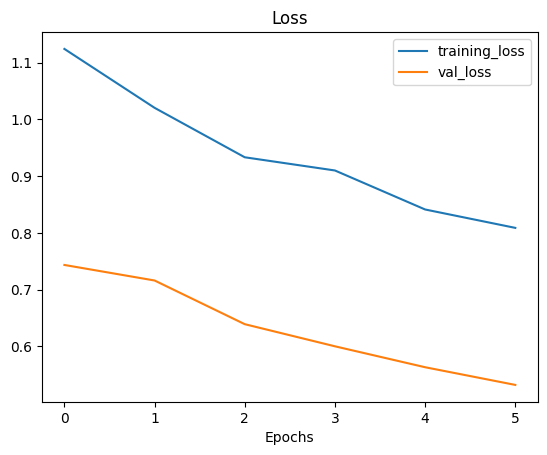

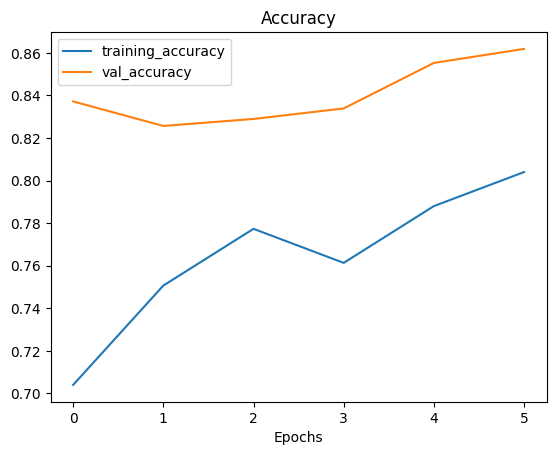

In [ ]:
# Check out the loss curves of our fine-tuned model
plot_loss_curves(history_fine_10_percent_data_aug)

The `plot_loss_curves` function works great with models which have only been fit once, however, we want something to compare one series of running `fit()` with another (e.g. before and after fine-tuning).

In [ ]:
# Let's create a function to compare training histories
def compare_historys(original_history, new_history, initial_epochs=5):
  """
  Compreas two TensorFlow History objects.
  """
  # Get original history measurements
  acc = original_history.history['accuracy']
  loss = original_history.history['loss']

  val_acc = original_history.history['val_accuracy']
  val_loss = original_history.history['val_loss']

  # Combine original_history metrics with new_history metrics
  total_acc = acc + new_history.history['accuracy']
  total_loss = loss + new_history.history['loss']

  total_val_acc = val_acc + new_history.history['val_accuracy']
  total_val_loss = val_loss + new_history.history['val_loss']

  # Make plot for accuracy
  plt.figure(figsize=(8, 8))
  plt.subplot(2, 1, 1)
  plt.plot(total_acc, label='Training Accuracy')
  plt.plot(total_val_acc, label='Validation Accuracy')
  plt.plot([initial_epochs-1, initial_epochs-1], plt.ylim(), label='Start Fine Tuning')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  # Make plot for loss
  plt.figure(figsize=(8, 8))
  plt.subplot(2, 1, 2)
  plt.plot(total_loss, label='Training Loss')
  plt.plot(total_val_loss, label='Validation Loss')
  plt.plot([initial_epochs-1, initial_epochs-1], plt.ylim(), label='Start Fine Tuning')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')

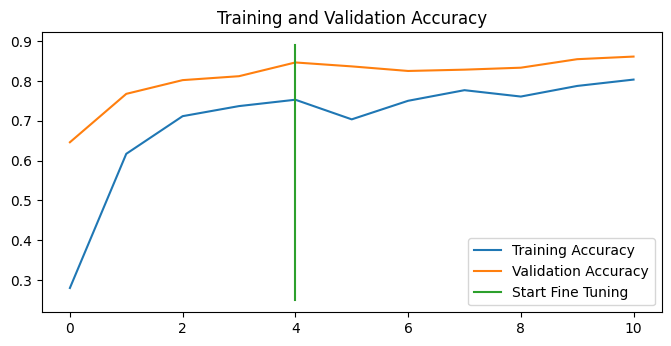

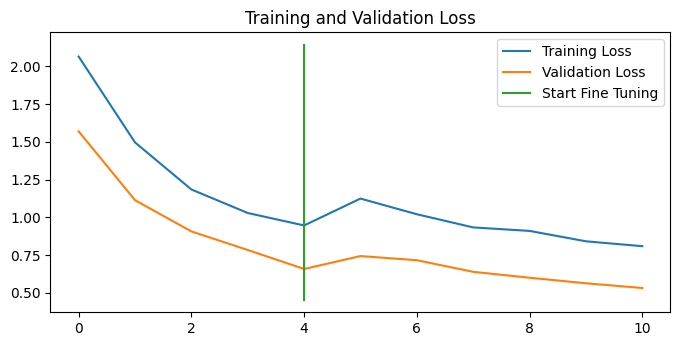

In [ ]:
compare_historys(original_history=history_10_percent_data_aug,
                 new_history=history_fine_10_percent_data_aug,
                 initial_epochs=5)

It looks like fine-tuning hasn't improved results for me as much as in the videos.

## Model 4: Fine-tuning an existing model on all of the data

In [ ]:
# Download and unzip 10 classes of Food101 data with all images
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
unzip_data('10_food_classes_all_data.zip')

--2025-02-28 00:17:46--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.10.207, 142.251.12.207, 172.217.194.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.10.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip’

10_food_classes_all 100%[===================>] 495.13M  17.2MB/s    in 28s     

2025-02-28 00:18:14 (17.7 MB/s) - ‘10_food_classes_all_data.zip’ saved [519183241/519183241]



In [ ]:
# Set up training and test dirs
train_dir_all_data = '10_food_classes_all_data/train'
test_dir = '10_food_classes_all_data/test'

In [ ]:
# How many images are we working with now?
walk_through_dir('10_food_classes_all_data')

There are 2 directories and 0 images in '10_food_classes_all_data'.
There are 10 directories and 0 images in '10_food_classes_all_data/test'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/fried_rice'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/sushi'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/steak'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/ice_cream'.
There are 

In [ ]:
# Setup data inputs
IMG_SIZE = (224, 224)

train_data_10_classes_full = tf.keras.preprocessing.image_dataset_from_directory(train_dir_all_data,
                                                                                 label_mode='categorical',
                                                                                 image_size=IMG_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode='categorical',
                                                                image_size=IMG_SIZE)

Found 7500 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


The test dataset we've loaded in is the same as what we've been using for previous experiments (all experiments have used the same test dataset).

Let's verify this...

In [ ]:
# Evluate model_2 (this is the fine-tuned on 10 percent of data version)
model_2.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - accuracy: 0.8419 - loss: 0.5382


[0.5636740922927856, 0.8348000049591064]

In [ ]:
results_fine_tune_10_percent

[0.56367427110672, 0.8348000049591064]

To train a fine-tuning model (model_4) we need to revert model_2 back to its feature extraction weights.

In [ ]:
# Load weights from checkpoint, so that way we can fine-tune from
# the same stage the 10 percent data model was fine tuned on
model_2.load_weights(checkpoint_path)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 26 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# Let's evaluate model_2 now
model_2.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - accuracy: 0.8220 - loss: 0.6956


[0.7177246809005737, 0.8184000253677368]

In [ ]:
# Check to see if our model_2 has been reverted back to feature extraction results
results_10_percent_data_aug

[0.717724621295929, 0.8184000253677368]

Alright, the previous steps might seems quite confusing but all we've done is:

1. Trained a feature extraction transfer learning model for 5 epochs on 10% of the data with data augmentation (model_2) and we saved the model's weights using `ModelCheckpoint` callback.
2. Fine-tuned the same model on the same 10% of the data for a further 5 epochs with the top 10 layers of the base model unfrozen (model_3).
3. Saved the results and training logs each time.
4. Reloaded the model from step 1 to do the same steps as step 2 except this time we're going to use all of the data (model_4).

In [ ]:
# Check which layers are tunable in the whole model
for layer_number, layer in enumerate(model_2.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer True
1 data_augmentation True
2 efficientnetv2-b0 True
3 global_average_pooling_2D True
4 output_layer True


In [ ]:
# Let's drill into our base_model (EfficientNetV2B0) and see what layers are trainable
for layer_number, layer in enumerate(model_2.layers[2].layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer_15 False
1 rescaling_13 False
2 normalization_12 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a

In [ ]:
# We reverted the weights of our model_2, and what do we have to do when we make changes to our models?
# Recompile the model!
model_2.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # decrease learning rate by 10x for tine-tuning
                metrics=['accuracy'])

In [ ]:
# Continue to train and fine-tune the model to our data (100% of training data)
fine_tune_epochs = initial_epochs + 5

history_fine_100_classes_full = model_2.fit(train_data_10_classes_full,
                                            epochs=fine_tune_epochs,
                                            validation_data=test_data,
                                            validation_steps=int(0.25 * len(test_data)),
                                            initial_epoch=history_10_percent_data_aug.epoch[-1],
                                            callbacks=[create_tensorboard_callback(dir_name='transfer_learning',
                                                                                   experiment_name='full_10_classes_fine_tune_last_10')])

Saving TensorBoard log files to: transfer_learning/full_10_classes_fine_tune_last_10/20250228-004550
Epoch 5/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - accuracy: 0.6919 - loss: 1.1231 - val_accuracy: 0.8553 - val_loss: 0.4677
Epoch 6/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - accuracy: 0.7584 - loss: 0.8304 - val_accuracy: 0.8914 - val_loss: 0.3389
Epoch 7/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.7837 - loss: 0.7226 - val_accuracy: 0.8997 - val_loss: 0.3015
Epoch 8/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - accuracy: 0.8048 - loss: 0.6492 - val_accuracy: 0.9178 - val_loss: 0.2780
Epoch 9/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8132 - loss: 0.6049 - val_accuracy: 0.9145 - val_loss: 0.2721
Epoch 10/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8183 - loss: 0.5842 - val_accuracy: 0.9211 - val_loss: 0.2452


In [ ]:
# Let's evaluate on all of the test data
results_fine_tune_full_data = model_2.evaluate(test_data)
results_fine_tune_full_data

79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.9088 - loss: 0.2742


[0.2792830467224121, 0.9075999855995178]

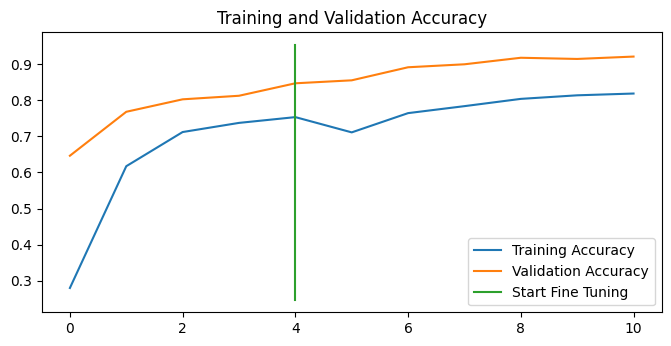

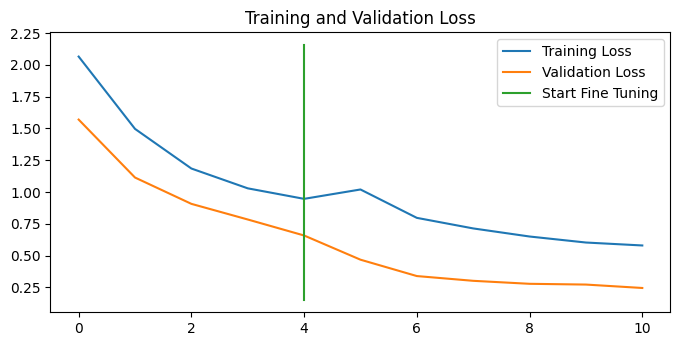

In [ ]:
# How did fine-tuning go with more data?
compare_historys(original_history=history_10_percent_data_aug,
                 new_history=history_fine_100_classes_full,
                 initial_epochs=5)

## viewing our experiment data on TensorBoard

> 🔑 **Note:** Need to adapt this to Weights & Biases for real world apps since TensorBoard is being deprecated.

In [ ]:
# View tensorboard logs of transfer learning modelling experiments (should ~4)
# Upload TensorBoard
%load_ext tensorboard

In [ ]:
%tensorboard --logdir=transfer_learning --window_title="Transfer Learning Experiments with 10 Food101 Classes"

<IPython.core.display.Javascript object>

What is the takeaway from this so far, seeing as my model's didn't improve as much with fine-tuning as Daniel's?

Well, it looks likes fine-tuning was only helpful when trained on all of the data. When trained on too little data (1%) the model (model_3) stopped improving. However, when we gave it all of the data, the model (model_4) finally got over 90% accuracy on the validation data.

My suspicion is that I either unfroze and fine-tuned too many layers, I fine-tuned the wrong layers, and/ or decreasing the learning rate by 10x wasn't the best learning rate for the fine-tuning stage of the model's training.

## 📖 Exercises & Extra-curriculum

**Exercises**
1. Write a function to visualize an image from any dataset (train or test file) and any class (e.g. "steak", "pizza"... etc), visualize it and make a prediction on it using a trained model.
2. Use feature-extraction to train a transfer learning model on 10% of the Food Vision data for 10 epochs using `tf.keras.applications.efficientnet_v2.EfficientNetV2B0` as the base model. Use the `ModelCheckpoint` callback to save the weights to file.
3. Fine-tune the last 20 layers of the base model you trained in 2 for another 10 epochs. How did it go?
4. Fine-tune the last 30 layers of the base model you trained in 2 for another 10 epochs. How did it go?

**Extra-curriculum**
* Read the [documentation on data augmentation](https://www.tensorflow.org/tutorials/images/data_augmentation) in TensorFlow.
* Read the [ULMFit paper](https://arxiv.org/abs/1801.06146) (technical) for an introduction to the concept of freezing and unfreezing different layers.
* Read up on learning rate scheduling (there's a TensorFlow callback for this), how could this influence our model training?
 * If you're training for longer, you probably want to reduce the learning rate as you go... the closer you get to the bottom of the hill, the smaller steps you want to take. Imagine it like finding a coin at the bottom of your couch. In the beginning your arm movements are going to be large and the closer you get, the smaller your movements become.

In [ ]:
# Import libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random

In [ ]:
# Import and get helper functions from helper_function.py
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py

from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, walk_through_dir

--2025-03-01 00:27:28--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2025-03-01 00:27:28 (64.8 MB/s) - ‘helper_functions.py’ saved [10246/10246]



### Exercise 1

In [ ]:
# Write function to make and view predictions on images
def dataset_visualizer(dataset, model, class_names):
  '''
  Arguments:
    dataset --> `tf.data.Dataset` object with (image , label) tuples
    model --> the trained model

  Returns:
    Visualizae the image from the dataset and the prediction class of the image.
  '''
  image_batch , label_batch = dataset.as_numpy_iterator().next()
  batch_prob = [model.predict(tf.expand_dims(img , axis = 0)) for img in image_batch]
  batch_preds = [class_names[np.argmax(prob)] for prob in batch_prob]

  plt.figure(figsize= (10 , 10))
  for i in range(4):
    ax = plt.subplot(2 , 2 , i + 1)
    if class_names[np.argmax(label_batch[i])] == batch_preds[i]:
      title_color = 'g'
    else:
      title_color = 'r'
    plt.imshow(image_batch[i].astype('uint8'))
    plt.title(f"actual: {class_names[np.argmax(label_batch[i])]}, pred: {batch_preds[i]}, prob: {batch_prob[i].max():.2f}" , c = title_color)
    plt.axis('off')


### Exercise 2

Use feature-extraction to train a transfer learning model on 10% of the Food Vision data for 10 epochs using `tf.keras.applications.efficientnet_v2.EfficientNetV2B0` as the base model. Use the `ModelCheckpoint` callback to save the weights to file.

In [ ]:
# Get 10% of training data of 10 classes of Food101
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip

unzip_data('10_food_classes_10_percent.zip')

--2025-03-01 00:28:09--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.141.207, 74.125.137.207, 142.250.101.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.141.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 168546183 (161M) [application/zip]
Saving to: ‘10_food_classes_10_percent.zip’

10_food_classes_10_ 100%[===================>] 160.74M   185MB/s    in 0.9s    

2025-03-01 00:28:10 (185 MB/s) - ‘10_food_classes_10_percent.zip’ saved [168546183/168546183]



In [ ]:
# View the files and directories
walk_through_dir('10_food_classes_10_percent')

There are 2 directories and 0 images in '10_food_classes_10_percent'.
There are 10 directories and 0 images in '10_food_classes_10_percent/train'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/ice_cream'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/fried_rice'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/sushi'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/steak'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/chicken_curry'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/pizza'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/hamburger'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/chicken_wings'.
There are 0 directories and 75 images in '10_food_classes_10_percent/train/grilled_salmon'.
There are 0 directories and 75 images in '10_food_classes_10_percent

In [ ]:
# Get the data from directories
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_dir = '10_food_classes_10_percent/train'
test_dir = '10_food_classes_10_percent/test'


train_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=train_dir,
                                                                            image_size=IMG_SIZE,
                                                                            label_mode='categorical',
                                                                            batch_size=BATCH_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(directory=test_dir,
                                                                image_size=IMG_SIZE,
                                                                label_mode='categorical',
                                                                batch_size=BATCH_SIZE)



Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [ ]:
# Setup the input shape and base model, freezing the base model layers
input_shape = (224, 224, 3)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False

# Create input layer
inputs = layers.Input(shape=input_shape, name='input_layer')
print(f'The shape of the inputs_layers is {inputs.shape}')

# Create the data augmentation layer
data_augmentation = keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
    layers.RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2)),
    layers.RandomTranslation(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2))
], name='data_augmentation')

# Add data augmentation Sequential model as layer
x = data_augmentation(inputs)

# Give base_model the inputs (after augmentation) and don't train it
x = base_model(x, training=False)

# Pool output features of the base model
x = layers.GlobalAveragePooling2D(name='global_average_pooling_2D')(x)

# Create the output layer
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)

# Make the model using inputs and outputs
exercise_model_1 = keras.Model(inputs, outputs)

The shape of the inputs_layers is (None, 224, 224, 3)


In [ ]:
# Write function to view random augmented images
def view_random_augmented_images(class_names, path, data_augmentation):
  # Check out the changes to images after the data augmentation layer
  target_class = random.choice(class_names)
  target_dir = path + '/' + target_class
  random_image = random.choice(os.listdir(target_dir))
  random_image_path = target_dir + '/' + random_image

  # Read and plot in the random image
  img = mpimg.imread(random_image_path)
  plt.imshow(img)
  plt.title(f"Original random iamge from class: {target_class}")
  plt.axis(False);

  # Now let's plot our augmented random image
  augmented_img = data_augmentation(tf.expand_dims(img, axis=0))
  plt.figure()
  plt.imshow(tf.squeeze(augmented_img)/255.)
  plt.title(f'Augmented random image from class: {target_class}')
  plt.axis(False);

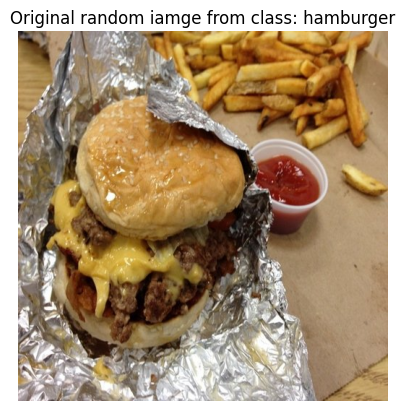

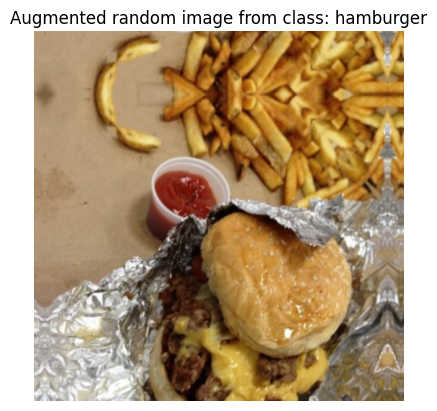

In [ ]:
view_random_augmented_images(class_names=train_data_10_percent.class_names,
                             path=train_dir,
                             data_augmentation=data_augmentation)

In [ ]:
# Compile the model
exercise_model_1.compile(loss='categorical_crossentropy',
                         optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                         metrics=['accuracy'])

In [ ]:
# View model summary
exercise_model_1.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_2D            │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
# Setup checkpoint path
checkpoint_path = 'ten_percent_model_checkpoints_weights/checkpoint.weights.h5'

# Create a ModelCheckpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                         save_best_only=False,
                                                         save_weights_only=True,
                                                         save_freq='epoch',
                                                         verbose=1)

# Set initial epochs for 10 epochs
initial_epochs = 10

# Fit the model with a ModelCheckpoint callback
history_exercise_1 = exercise_model_1.fit(train_data_10_percent,
                                          epochs=initial_epochs,
                                          validation_data=test_data,
                                          validation_steps=int(0.25 * len(test_data)),
                                          callbacks=[checkpoint_callback])

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.1970 - loss: 2.2635
Epoch 1: saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 22s 311ms/step - accuracy: 0.1998 - loss: 2.2574 - val_accuracy: 0.6003 - val_loss: 1.6506
Epoch 2/10
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.5476 - loss: 1.6277
Epoch 2: saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step - accuracy: 0.5496 - loss: 1.6222 - val_accuracy: 0.7220 - val_loss: 1.2180
Epoch 3/10
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.6933 - loss: 1.2709
Epoch 3: saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - accuracy: 0.6917 - loss: 1.2698 - val_accuracy: 0.7566 - val_loss: 0.9891
Epoch 4/10
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.7202 - loss: 1.0984
Epoch 4: saving model to ten_percent_model_checkpoint

In [ ]:
# Evaluate on the full dataset
results_exercise_model_1 = exercise_model_1.evaluate(test_data)
results_exercise_model_1

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - accuracy: 0.8453 - loss: 0.5375


[0.544483482837677, 0.8468000292778015]

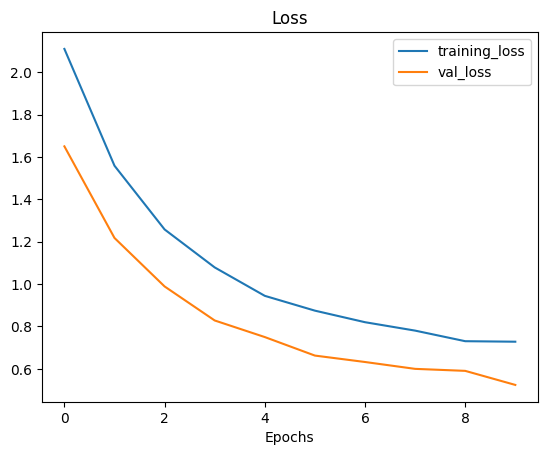

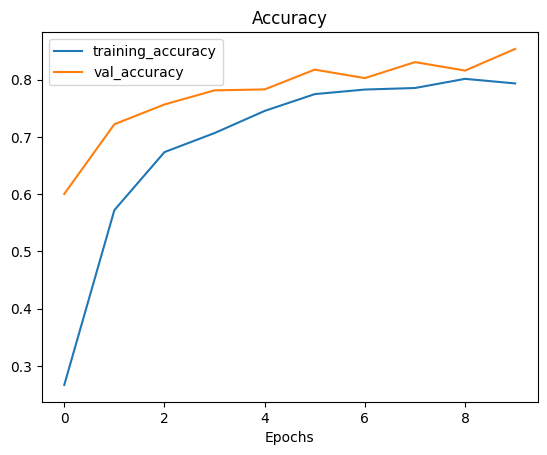

In [ ]:
# Plot the accuracy and loss curves
plot_loss_curves(history_exercise_1)

### Exercise 3

Fine-tune the last 20 layers of the base model you trained in 2 for another 10 epochs. How did it go?

In [ ]:
# Load checkpointed weights to make sure they were saved correctly and evaluate test data with loaded weights
exercise_model_1.load_weights(checkpoint_path)

results_loaded_weights_model = exercise_model_1.evaluate(test_data)

79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - accuracy: 0.8452 - loss: 0.5437


In [ ]:
# Check if results of our model match the results of the loaded weights evaluated above
results_exercise_model_1, results_loaded_weights_model

([0.544483482837677, 0.8468000292778015],
 [0.5444836616516113, 0.8468000292778015])

In [ ]:
# use np.isclose() to see if the results are close within a tolerance
np.isclose(np.array(results_exercise_model_1), np.array(results_loaded_weights_model))

array([ True,  True])

In [ ]:
# Let's see what the actual difference is, but they should be close enough
print(np.array(results_exercise_model_1) - np.array(results_loaded_weights_model))

[-1.78813934e-07  0.00000000e+00]


In [ ]:
# Check the layers in the model with reloaded weights
exercise_model_1.layers

[<InputLayer name=input_layer, built=True>,
 <Sequential name=data_augmentation, built=True>,
 <Functional name=efficientnetv2-b0, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling_2D, built=True>,
 <Dense name=output_layer, built=True>]

In [ ]:
# See if any of these layers trainable?
for layer in exercise_model_1.layers:
  print(layer.name, layer.trainable)

input_layer True
data_augmentation True
efficientnetv2-b0 False
global_average_pooling_2D True
output_layer True


In [ ]:
# See what layers are in our base model and if they're trainable
for i, layer in enumerate(exercise_model_1.layers[2].layers):
  print(i, layer.name, layer.trainable)

0 input_layer_2 False
1 rescaling_1 False
2 normalization_1 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a_dw

In [ ]:
# See total number of trainable weights in the base_model
print(len(exercise_model_1.layers[2].trainable_variables))

0


In [ ]:
# Set the base_model to trainable
base_model.trainable = True

# Freeze all layers except the last 20 so only those are now trainable
for layer in base_model.layers[:-20]:
  layer.trainable = False

# After making changes to the base_model recompile exercise_model_1
exercise_model_1.compile(loss='categorical_crossentropy',
                         optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # decrease learning rate by 10x for fine tuning
                         metrics=['accuracy'])

In [ ]:
# See which layers are now trainable in the base_model
for i, layer in enumerate(exercise_model_1.layers[2].layers):
  print(i, layer.name, layer.trainable)

0 input_layer_2 False
1 rescaling_1 False
2 normalization_1 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a_dw

In [ ]:
# Get the total number of layers that are now trainable in the base_model
print(len(exercise_model_1.layers[2].trainable_variables))

16


**Note:** For some reason I can count that there are 20 layers in the base_model that are trainable, but when I run the cell above it only says there are 16. I will go with that for now as I *SUSPECT* there may be some layers that don't have any weights to train, and so they don't get logged as trainable when I call the `.trainable_variables` method.

In [ ]:
# Fine tune for an additional 10 epochs
fine_tune_epochs = initial_epochs + 10

# Fit the model with 20 trainable layers in the base_model and run for 10 additional epochs
history_exercise_2 = exercise_model_1.fit(train_data_10_percent,
                                          epochs=fine_tune_epochs,
                                          steps_per_epoch=len(train_data_10_percent),
                                          validation_data=test_data,
                                          validation_steps=len(test_data),
                                          initial_epoch=history_exercise_1.epoch[-1]) # start training from the last epoch where we left off with original model

Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 27s 461ms/step - accuracy: 0.7716 - loss: 0.9610 - val_accuracy: 0.8388 - val_loss: 0.6290
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 16s 296ms/step - accuracy: 0.7905 - loss: 0.8539 - val_accuracy: 0.8460 - val_loss: 0.5874
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 16s 536ms/step - accuracy: 0.8313 - loss: 0.7773 - val_accuracy: 0.8488 - val_loss: 0.5545
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 313ms/step - accuracy: 0.8220 - loss: 0.7615 - val_accuracy: 0.8520 - val_loss: 0.5243
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 364ms/step - accuracy: 0.8238 - loss: 0.7002 - val_accuracy: 0.8548 - val_loss: 0.5079
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 353ms/step - accuracy: 0.8426 - loss: 0.6692 - val_accuracy: 0.8576 - val_loss: 0.4902
Epoch 16/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 335ms/step - accuracy: 0.8560 - loss: 0.6081 - val_accuracy: 0.8632 - val_loss: 0.4734
Epoch 17/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 321ms/step - accuracy: 0.8519 - loss: 0.5905 - va

In [ ]:
# Evaluate the model
results_exercise_model_2 = exercise_model_1.evaluate(test_data)
results_exercise_model_2

79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.8730 - loss: 0.4257


[0.4331934452056885, 0.8679999709129333]

In [ ]:
# Compare the results with the first model (no trainable layers in base_model)
results_exercise_model_1, results_exercise_model_2

([0.544483482837677, 0.8468000292778015],
 [0.4331934452056885, 0.8679999709129333])

Okay, so accuracy has slightly increased with 20 trainable layers in the base model, but not a huge improvement.

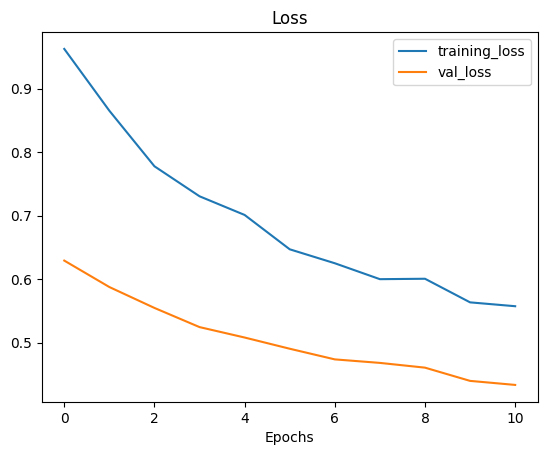

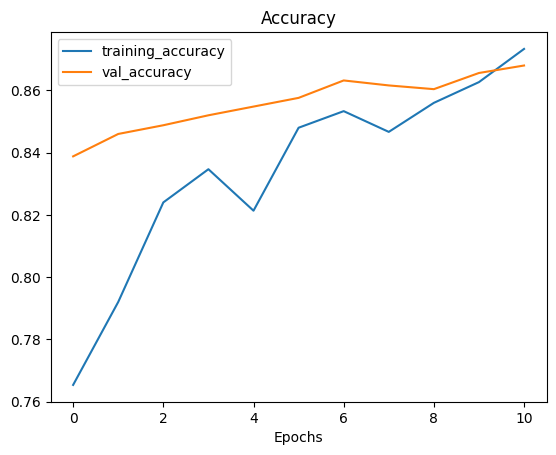

In [ ]:
# Plot the loss curves
plot_loss_curves(history_exercise_2)

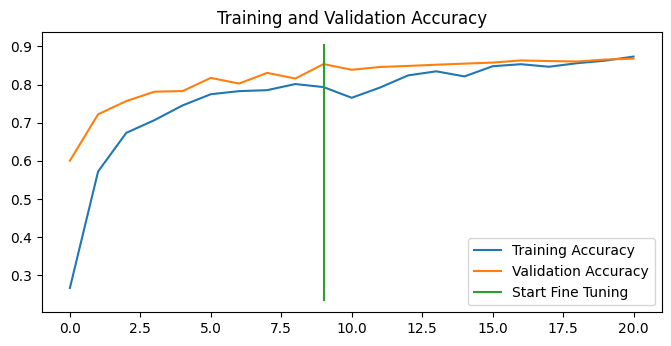

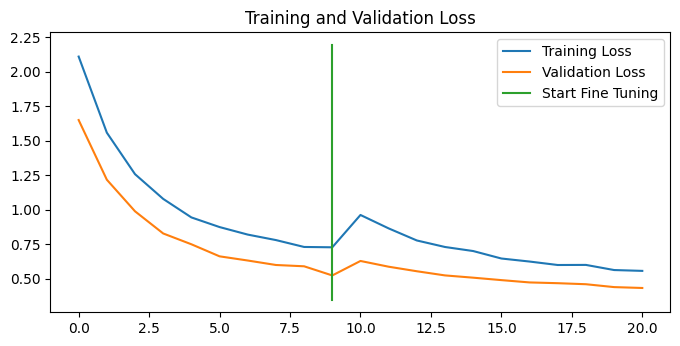

In [ ]:
# Compare history of the loss curves
compare_historys(original_history=history_exercise_1,
                 new_history=history_exercise_2,
                 initial_epochs=10)

Not actually seeing much improvement here. I think like during the module this is probably overkill. Okay, now let's try it with 30 layers unfrozen... YAYA!

### Exercise 4

Fine-tune the last 30 layers of the base model you trained in 2 for another 10 epochs. How did it go?

In [ ]:
# Load checkpointed weights for next fine tuning experiment (30 trainable layers in base_model)
# and evaluate to make sure model has been reverted back to feature extraction results
exercise_model_1.load_weights(checkpoint_path)

results_loaded_weights_model = exercise_model_1.evaluate(test_data)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


79/79 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - accuracy: 0.8372 - loss: 0.5549


In [ ]:
# Check if results of our model match the results of the loaded weights model
results_exercise_model_1, results_loaded_weights_model

([0.544483482837677, 0.8468000292778015],
 [0.5444836020469666, 0.8468000292778015])

In [ ]:
# use np.isclose() to see if the results are close within a tolerance
np.isclose(np.array(results_exercise_model_1), np.array(results_loaded_weights_model))

array([ True,  True])

In [ ]:
# Check the actual difference between the results to make sure they're very small
print(np.array(results_exercise_model_1) - np.array(results_loaded_weights_model))

[-1.1920929e-07  0.0000000e+00]


In [ ]:
# Check layers in model with reloaded weights
exercise_model_1.layers

[<InputLayer name=input_layer, built=True>,
 <Sequential name=data_augmentation, built=True>,
 <Functional name=efficientnetv2-b0, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling_2D, built=True>,
 <Dense name=output_layer, built=True>]

In [ ]:
# Check which layers are tunable in the whole model
for layer_number, layer in enumerate(exercise_model_1.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer True
1 data_augmentation True
2 efficientnetv2-b0 True
3 global_average_pooling_2D True
4 output_layer True


In [ ]:
# Let's see exactly what layers in our base_model are trainable
for layer_number, layer in enumerate(exercise_model_1.layers[2].layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer_2 False
1 rescaling_1 False
2 normalization_1 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a_dw

In [ ]:
# Set the base_model to trainable to we can increase trainable layers from 20 to 30
base_model.trainable = True

for layer in base_model.layers[-30:]:
  layer.trainable = True

# Recompile the model (if we don't recompile it, then we won't see the new 30 trainable layers, it will still only show 20 trainable layers)
exercise_model_1.compile(loss='categorical_crossentropy',
                         optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                         metrics=['accuracy'])

In [ ]:
print(len([layer for layer in base_model.layers if layer.trainable]))  # Check trainable layers count

30


In [ ]:
# Let's see how many layers in our base_model are now trainable (should be 30)
for layer_number, layer in enumerate(exercise_model_1.layers[2].layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer_2 False
1 rescaling_1 False
2 normalization_1 False
3 stem_conv False
4 stem_bn False
5 stem_activation False
6 block1a_project_conv False
7 block1a_project_bn False
8 block1a_project_activation False
9 block2a_expand_conv False
10 block2a_expand_bn False
11 block2a_expand_activation False
12 block2a_project_conv False
13 block2a_project_bn False
14 block2b_expand_conv False
15 block2b_expand_bn False
16 block2b_expand_activation False
17 block2b_project_conv False
18 block2b_project_bn False
19 block2b_drop False
20 block2b_add False
21 block3a_expand_conv False
22 block3a_expand_bn False
23 block3a_expand_activation False
24 block3a_project_conv False
25 block3a_project_bn False
26 block3b_expand_conv False
27 block3b_expand_bn False
28 block3b_expand_activation False
29 block3b_project_conv False
30 block3b_project_bn False
31 block3b_drop False
32 block3b_add False
33 block4a_expand_conv False
34 block4a_expand_bn False
35 block4a_expand_activation False
36 block4a_dw

In [ ]:
# Fine tune for an additional 10 epochs
fine_tune_epochs = initial_epochs + 10

# Fit the model with 30 trainable layers in the base_model and run for 10 additional epochs
history_exercise_3 = exercise_model_1.fit(train_data_10_percent,
                                          epochs=fine_tune_epochs,
                                          steps_per_epoch=len(train_data_10_percent),
                                          validation_data=test_data,
                                          validation_steps=len(test_data),
                                          initial_epoch=history_exercise_1.epoch[-1])

Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 27s 455ms/step - accuracy: 0.7420 - loss: 1.0371 - val_accuracy: 0.8444 - val_loss: 0.6203
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 19s 383ms/step - accuracy: 0.8041 - loss: 0.8932 - val_accuracy: 0.8488 - val_loss: 0.5900
Epoch 12/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 527ms/step - accuracy: 0.8162 - loss: 0.7814 - val_accuracy: 0.8568 - val_loss: 0.5512
Epoch 13/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 320ms/step - accuracy: 0.8396 - loss: 0.7082 - val_accuracy: 0.8524 - val_loss: 0.5231
Epoch 14/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 298ms/step - accuracy: 0.8248 - loss: 0.6879 - val_accuracy: 0.8604 - val_loss: 0.4950
Epoch 15/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 351ms/step - accuracy: 0.8271 - loss: 0.6538 - val_accuracy: 0.8560 - val_loss: 0.4929
Epoch 16/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 14s 531ms/step - accuracy: 0.8614 - loss: 0.6017 - val_accuracy: 0.8608 - val_loss: 0.4717
Epoch 17/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 14s 259ms/step - accuracy: 0.8659 - loss: 0.5439 - va

In [ ]:
# Evaluate the model
results_exercise_model_3 = exercise_model_1.evaluate(test_data)
results_exercise_model_3

79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.8722 - loss: 0.4240


[0.4243852496147156, 0.8715999722480774]

In [ ]:
# Compare results with other runs
results_exercise_model_1, results_exercise_model_2, results_exercise_model_3

([0.544483482837677, 0.8468000292778015],
 [0.4331934452056885, 0.8679999709129333],
 [0.4243852496147156, 0.8715999722480774])

Cool, so accuracy on the validation data is still improving, but only by ~1% point. Not awesome, but again, I feel like using EfficientNetV2B0 might simply be overkill for this dataset.

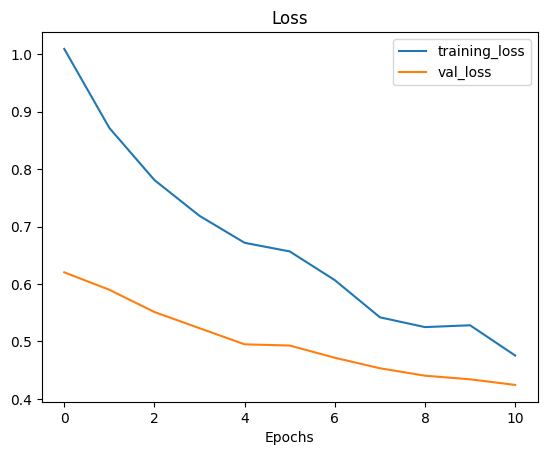

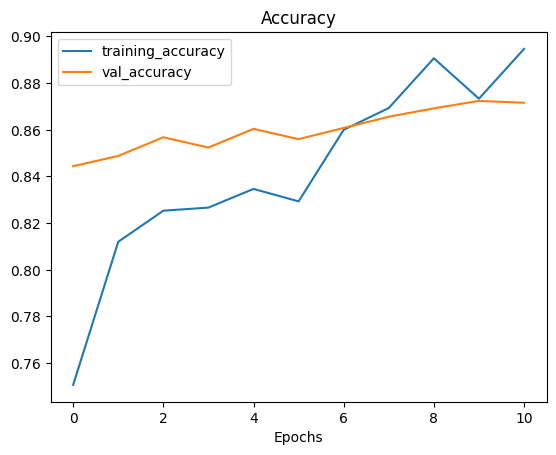

In [ ]:
# Plot loss curves
plot_loss_curves(history_exercise_3)

So the loss looks good, but, it appears that most recent model wasn't able to increase the validation accuracy by very much at all.

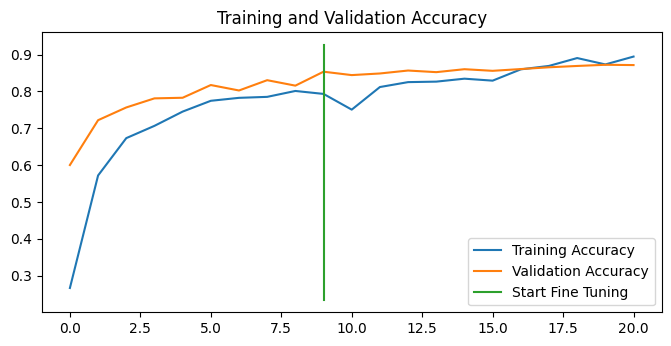

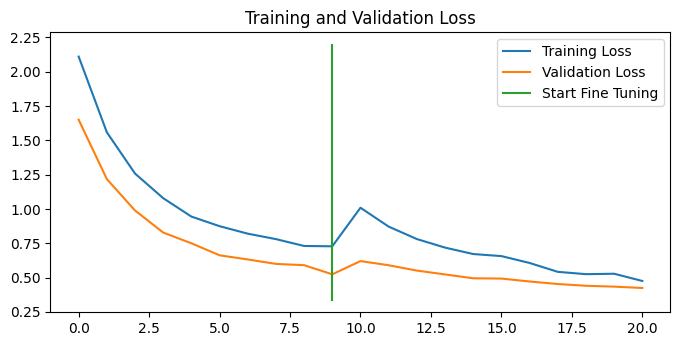

In [ ]:
# Compare loss curves of most recent run to original model
compare_historys(original_history=history_exercise_1,
                 new_history=history_exercise_3,
                 initial_epochs=10)

Yea, so by unfreezing additional layers we're really not improving the model much. But, I should note that this is just transfer learning practice, and we're only running the models with trainable layers in the base_model for 10 epochs.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━

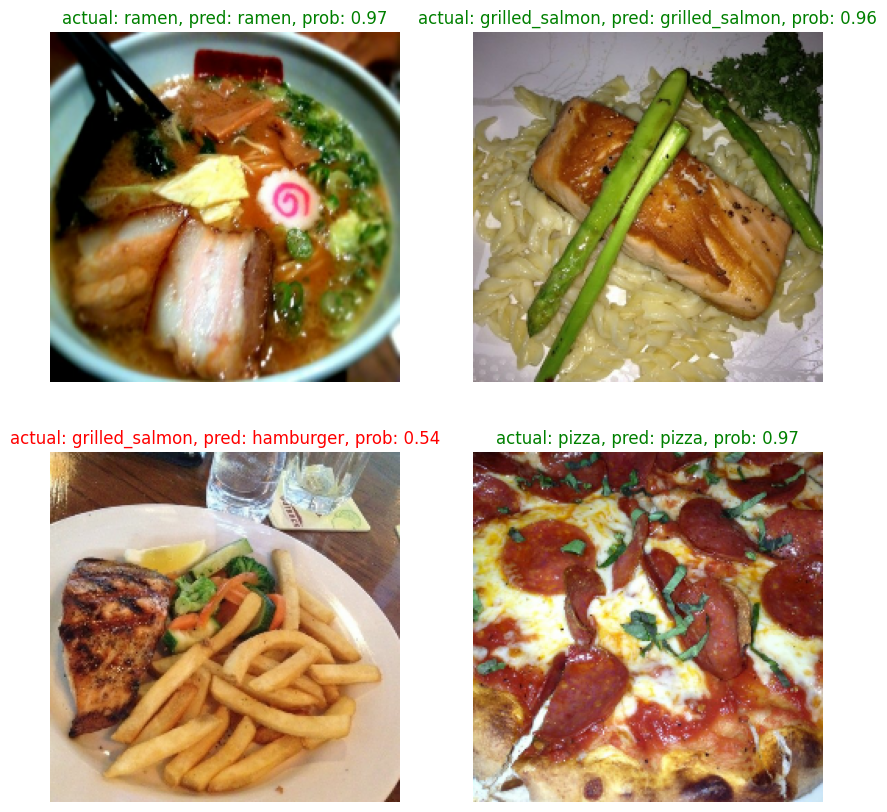

In [ ]:
dataset_visualizer(dataset=test_data, model=exercise_model_1, class_names=test_data.class_names)